# Panoptic Segmentation

##### Detectron2 설치

In [ ]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 81.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 KB 54.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 MB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 76.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.6/102.6 MB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.1/317.1 MB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.2/173.2 MB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 100.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.1/557.1 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━

In [ ]:
# panoptic coco api 라이브러리 설치
!pip install git+https://github.com/cocodataset/panopticapi.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/panopticapi.git to /tmp/pip-req-build-ck7ullf3
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/panopticapi.git /tmp/pip-req-build-ck7ullf3
  Resolved https://github.com/cocodataset/panopticapi.git to commit 7bb4655548f98f3fedc07bf37e9040a992b054b0
  Preparing metadata (setup.py) ... done
  Created wheel for panopticapi: filename=panopticapi-0.1-py3-none-any.whl size=8297 sha256=fe5dd6e86f48b9fcd001fb5e26b52a37f3a91e5383db636e60d1b329305bc8a2
  Stored in directory: /tmp/pip-ephem-wheel-cache-xwwnodld/wheels/4a/6b/52/6a1fee2c513be4b855fa75ec878335871c9967efb4f8ac2682
Successfully built panopticapi


In [ ]:
# 라이브러리 임포트

# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import torch
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.evaluation import COCOPanopticEvaluator, inference_on_dataset
from detectron2.data.datasets import register_coco_panoptic_separated
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader

##### Detectron2 데이터셋 구성



```
coco/
  annotations/
    panoptic_{train,val}2017.json
  panoptic_{train,val}2017/  # png annotations
  panoptic_stuff_{train,val}2017/  # generated by the script mentioned below

pip install git+https://github.com/cocodataset/panopticapi.git
```




In [ ]:
!wget http://images.cocodataset.org/zips/train2017.zip
!wget http://images.cocodataset.org/zips/val2017.zip
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!wget http://images.cocodataset.org/annotations/panoptic_annotations_trainval2017.zip

--2023-03-21 02:16:37--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.36.28, 52.217.206.241, 52.216.160.19, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.36.28|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

train2017.zip       100%[===================>]  18.01G  13.4MB/s    in 28m 21s 

2023-03-21 02:44:59 (10.8 MB/s) - ‘train2017.zip’ saved [19336861798/19336861798]

--2023-03-21 02:44:59--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.62.105, 54.231.162.49, 52.217.130.177, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.62.105|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘val2017.zip’

val2017.zip         100%[===================>] 

In [ ]:
# COCO Panoptic dataset 압축 해제
!unzip /content/panoptic_annotations_trainval2017.zip -d /content/detectron2_repo/datasets/coco
!rm panoptic_annotations_trainval2017.zip
!unzip /content/train2017.zip -d /content/detectron2_repo/datasets/coco
!rm train2017.zip
!unzip /content/val2017.zip -d /content/detectron2_repo/datasets/coco
!rm val2017.zip
!unzip /content/annotations_trainval2017.zip -d /content/detectron2_repo/datasets/coco
!rm annotations_trainval2017.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000365745.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000320425.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000481404.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000314294.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000335328.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000513688.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000158548.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000132116.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000415238.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000321333.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000081738.jpg  
 extracting: /content/detectron2_repo/datasets/coco/val2017/000000577584.jpg  
 extracting: /co

In [ ]:
!unzip /content/detectron2_repo/datasets/coco/annotations/panoptic_train2017.zip -d /content/detectron2_repo/datasets/coco
!rm /content/detectron2_repo/datasets/coco/annotations/panoptic_train2017.zip
!unzip /content/detectron2_repo/datasets/coco/annotations/panoptic_val2017.zip -d /content/detectron2_repo/datasets/coco
!rm /content/detectron2_repo/datasets/coco/annotations/panoptic_val2017.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000353027.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000489014.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000201775.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000245651.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000446117.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000215072.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000119828.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000523957.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000309467.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000090956.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_val2017/000000283038.pn

In [ ]:
%cd /content/detectron2_repo

/content/detectron2_repo


In [ ]:
!python ./datasets/prepare_panoptic_fpn.py

Start writing to datasets/coco/panoptic_stuff_val2017 ...
Finished. time: 22.28s
Start writing to datasets/coco/panoptic_stuff_train2017 ...
Finished. time: 514.69s
panoptic_val2017_100.json: 172kB [00:01, 115kB/s]               
Creating datasets/coco/panoptic_val2017_100 ...
Creating datasets/coco/panoptic_stuff_val2017_100 ...


In [ ]:
# train 데이터셋 등록
train_image_root = "/content/detectron2_repo/datasets/coco/train2017"
train_panoptic_root = "/content/detectron2_repo/datasets/coco/panoptic_train2017"
train_panoptic_json = "/content/detectron2_repo/datasets/coco/annotations/panoptic_train2017.json"
train_sem_seg_root = "/content/detectron2_repo/datasets/coco/panoptic_stuff_train2017"
train_instances_json = "/content/detectron2_repo/datasets/coco/annotations/instances_train2017.json"
register_coco_panoptic_separated("panoptic_train", {}, train_image_root, train_panoptic_root, train_panoptic_json, train_sem_seg_root, train_instances_json)

In [ ]:
# validation 데이터셋 등록
val_image_root = "/content/detectron2_repo/datasets/coco/val2017"
val_panoptic_root = "/content/detectron2_repo/datasets/coco/panoptic_val2017"
val_panoptic_json = "/content/detectron2_repo/datasets/coco/annotations/panoptic_val2017.json"
val_sem_seg_root = "/content/detectron2_repo/datasets/coco/panoptic_stuff_val2017"
val_instances_json = "/content/detectron2_repo/datasets/coco/annotations/instances_val2017.json"
register_coco_panoptic_separated("panoptic_val", {}, val_image_root, val_panoptic_root, val_panoptic_json, val_sem_seg_root, val_instances_json)

In [ ]:
train_metadata = MetadataCatalog.get("panoptic_train_separated")
val_metadata = MetadataCatalog.get("panoptic_val_separated")
train_metadata

Metadata(name='panoptic_train_separated', panoptic_root='/content/detectron2_repo/datasets/coco/panoptic_train2017', image_root='/content/detectron2_repo/datasets/coco/train2017', panoptic_json='/content/detectron2_repo/datasets/coco/annotations/panoptic_train2017.json', sem_seg_root='/content/detectron2_repo/datasets/coco/panoptic_stuff_train2017', json_file='/content/detectron2_repo/datasets/coco/annotations/instances_train2017.json', evaluator_type='coco_panoptic_seg', ignore_label=255)

In [ ]:
# 클래스명, 클래스 아이디-연속 숫자 아이디, 색상 정의
add_stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower', 'fruit', 'gravel', 'house', 'light', 'mirror-stuff', 'net', 'pillow', 'platform', 'playingfield', 'railroad', 'river', 'road', 'roof', 'sand', 'sea', 'shelf', 'snow', 'stairs', 'tent', 'towel', 'wall-brick', 'wall-stone', 'wall-tile', 'wall-wood', 'water', 'window-blind', 'window', 'tree', 'fence', 'ceiling', 'sky', 'cabinet', 'table', 'floor', 'pavement', 'mountain', 'grass', 'dirt', 'paper', 'food', 'building', 'rock', 'wall', 'rug']
add_stuff_dataset_id_to_contiguous_id={92: 1, 93: 2, 95: 3, 100: 4, 107: 5, 109: 6, 112: 7, 118: 8, 119: 9, 122: 10, 125: 11, 128: 12, 130: 13, 133: 14, 138: 15, 141: 16, 144: 17, 145: 18, 147: 19, 148: 20, 149: 21, 151: 22, 154: 23, 155: 24, 156: 25, 159: 26, 161: 27, 166: 28, 168: 29, 171: 30, 175: 31, 176: 32, 177: 33, 178: 34, 180: 35, 181: 36, 184: 37, 185: 38, 186: 39, 187: 40, 188: 41, 189: 42, 190: 43, 191: 44, 192: 45, 193: 46, 194: 47, 195: 48, 196: 49, 197: 50, 198: 51, 199: 52, 200: 53, 0: 0}
add_stuff_colors=[[82, 18, 128], [255, 255, 128], [147, 211, 203], [150, 100, 100], [168, 171, 172], [146, 112, 198], [210, 170, 100], [92, 136, 89], [218, 88, 184], [241, 129, 0], [217, 17, 255], [124, 74, 181], [70, 70, 70], [255, 228, 255], [154, 208, 0], [193, 0, 92], [76, 91, 113], [255, 180, 195], [106, 154, 176], [230, 150, 140], [60, 143, 255], [128, 64, 128], [92, 82, 55], [254, 212, 124], [73, 77, 174], [255, 160, 98], [255, 255, 255], [104, 84, 109], [169, 164, 131], [225, 199, 255], [137, 54, 74], [135, 158, 223], [7, 246, 231], [107, 255, 200], [58, 41, 149], [183, 121, 142], [255, 73, 97], [107, 142, 35], [190, 153, 153], [146, 139, 141], [70, 130, 180], [134, 199, 156], [209, 226, 140], [96, 36, 108], [96, 96, 96], [64, 170, 64], [152, 251, 152], [208, 229, 228], [206, 186, 171], [152, 161, 64], [116, 112, 0], [0, 114, 143], [102, 102, 156], [250, 141, 255]]
add_thing_classes=['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
add_thing_dataset_id_to_contiguous_id={1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 13: 11, 14: 12, 15: 13, 16: 14, 17: 15, 18: 16, 19: 17, 20: 18, 21: 19, 22: 20, 23: 21, 24: 22, 25: 23, 27: 24, 28: 25, 31: 26, 32: 27, 33: 28, 34: 29, 35: 30, 36: 31, 37: 32, 38: 33, 39: 34, 40: 35, 41: 36, 42: 37, 43: 38, 44: 39, 46: 40, 47: 41, 48: 42, 49: 43, 50: 44, 51: 45, 52: 46, 53: 47, 54: 48, 55: 49, 56: 50, 57: 51, 58: 52, 59: 53, 60: 54, 61: 55, 62: 56, 63: 57, 64: 58, 65: 59, 67: 60, 70: 61, 72: 62, 73: 63, 74: 64, 75: 65, 76: 66, 77: 67, 78: 68, 79: 69, 80: 70, 81: 71, 82: 72, 84: 73, 85: 74, 86: 75, 87: 76, 88: 77, 89: 78, 90: 79}
add_thing_colors=[[220, 20, 60], [119, 11, 32], [0, 0, 142], [0, 0, 230], [106, 0, 228], [0, 60, 100], [0, 80, 100], [0, 0, 70], [0, 0, 192], [250, 170, 30], [100, 170, 30], [220, 220, 0], [175, 116, 175], [250, 0, 30], [165, 42, 42], [255, 77, 255], [0, 226, 252], [182, 182, 255], [0, 82, 0], [120, 166, 157], [110, 76, 0], [174, 57, 255], [199, 100, 0], [72, 0, 118], [255, 179, 240], [0, 125, 92], [209, 0, 151], [188, 208, 182], [0, 220, 176], [255, 99, 164], [92, 0, 73], [133, 129, 255], [78, 180, 255], [0, 228, 0], [174, 255, 243], [45, 89, 255], [134, 134, 103], [145, 148, 174], [255, 208, 186], [197, 226, 255], [171, 134, 1], [109, 63, 54], [207, 138, 255], [151, 0, 95], [9, 80, 61], [84, 105, 51], [74, 65, 105], [166, 196, 102], [208, 195, 210], [255, 109, 65], [0, 143, 149], [179, 0, 194], [209, 99, 106], [5, 121, 0], [227, 255, 205], [147, 186, 208], [153, 69, 1], [3, 95, 161], [163, 255, 0], [119, 0, 170], [0, 182, 199], [0, 165, 120], [183, 130, 88], [95, 32, 0], [130, 114, 135], [110, 129, 133], [166, 74, 118], [219, 142, 185], [79, 210, 114], [178, 90, 62], [65, 70, 15], [127, 167, 115], [59, 105, 106], [142, 108, 45], [196, 172, 0], [95, 54, 80], [128, 76, 255], [201, 57, 1], [246, 0, 122], [191, 162, 208]]

In [ ]:
# 클래스명, 클래스 아이디-연속 숫자 아이디, 색상 정의 매핑
MetadataCatalog.get("panoptic_train_separated").set(stuff_classes=add_stuff_classes)
MetadataCatalog.get("panoptic_val_separated").set(stuff_classes=add_stuff_classes)

MetadataCatalog.get("panoptic_train_separated").set(stuff_dataset_id_to_contiguous_id=add_stuff_dataset_id_to_contiguous_id)
MetadataCatalog.get("panoptic_val_separated").set(stuff_dataset_id_to_contiguous_id=add_stuff_dataset_id_to_contiguous_id)

MetadataCatalog.get("panoptic_train_separated").set(stuff_colors=add_stuff_colors)
MetadataCatalog.get("panoptic_val_separated").set(stuff_colors=add_stuff_colors)

MetadataCatalog.get("panoptic_train_separated").set(thing_classes=add_thing_classes)
MetadataCatalog.get("panoptic_val_separated").set(thing_classes=add_thing_classes)

MetadataCatalog.get("panoptic_train_separated").set(thing_dataset_id_to_contiguous_id=add_thing_dataset_id_to_contiguous_id)
MetadataCatalog.get("panoptic_val_separated").set(thing_dataset_id_to_contiguous_id=add_thing_dataset_id_to_contiguous_id)

MetadataCatalog.get("panoptic_train_separated").set(thing_colors=add_thing_colors)
MetadataCatalog.get("panoptic_val_separated").set(thing_colors=add_thing_colors)

Metadata(name='panoptic_val_separated', panoptic_root='/content/detectron2_repo/datasets/coco/panoptic_val2017', image_root='/content/detectron2_repo/datasets/coco/val2017', panoptic_json='/content/detectron2_repo/datasets/coco/annotations/panoptic_val2017.json', sem_seg_root='/content/detectron2_repo/datasets/coco/panoptic_stuff_val2017', json_file='/content/detectron2_repo/datasets/coco/annotations/instances_val2017.json', evaluator_type='coco_panoptic_seg', ignore_label=255, stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower', 'fruit', 'gravel', 'house', 'light', 'mirror-stuff', 'net', 'pillow', 'platform', 'playingfield', 'railroad', 'river', 'road', 'roof', 'sand', 'sea', 'shelf', 'snow', 'stairs', 'tent', 'towel', 'wall-brick', 'wall-stone', 'wall-tile', 'wall-wood', 'water', 'window-blind', 'window', 'tree', 'fence', 'ceiling', 'sky', 'cabinet', 'table', 'floor', 'pavement', 'mountain', 'grass', 'dirt', 

In [ ]:
train_dataset_dicts = DatasetCatalog.get("panoptic_train_separated")
val_dataset_dicts = DatasetCatalog.get("panoptic_val_separated")
train_dataset_dicts

[03/21 03:03:17 d2.data.datasets.coco]: Loading /content/detectron2_repo/datasets/coco/annotations/instances_train2017.json takes 17.66 seconds.
WARNING [03/21 03:03:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 03:03:18 d2.data.datasets.coco]: Loaded 118287 images in COCO format from /content/detectron2_repo/datasets/coco/annotations/instances_train2017.json
[03/21 03:03:30 d2.data.datasets.coco]: Loaded 118287 images with semantic segmentation from /content/detectron2_repo/datasets/coco/train2017
WARNING [03/21 03:03:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 03:03:31 d2.data.datasets.coco]: Loaded 5000 images in COCO format from /content/detectron2_repo/datasets/coco/annotations/instances_val2017.json
[03/21 03:03:32 d2.data.datasets.coco]: Loaded 5000 images with semantic segmentation from /content/detectron2_repo/datasets/co

[{'file_name': '/content/detectron2_repo/datasets/coco/train2017/000000000009.jpg',
  'height': 480,
  'width': 640,
  'image_id': 9,
  'annotations': [{'iscrowd': 0,
    'bbox': [1.08, 187.69, 611.59, 285.84],
    'category_id': 45,
    'segmentation': [[500.49,
      473.53,
      599.73,
      419.6,
      612.67,
      375.37,
      608.36,
      354.88,
      528.54,
      269.66,
      457.35,
      201.71,
      420.67,
      187.69,
      389.39,
      192.0,
      19.42,
      360.27,
      1.08,
      389.39,
      2.16,
      427.15,
      20.49,
      473.53]],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>},
   {'iscrowd': 0,
    'bbox': [311.73, 4.31, 319.28, 228.68],
    'category_id': 45,
    'segmentation': [[357.03,
      69.03,
      311.73,
      15.1,
      550.11,
      4.31,
      631.01,
      62.56,
      629.93,
      88.45,
      595.42,
      185.53,
      513.44,
      230.83,
      488.63,
      232.99,
      437.93,
      190.92,
      429.3,
      189.84,
      

##### Panoptic FPN Model 학습

In [ ]:
# 재현성을 위한 랜덤시드 고정
random_seed = 2023
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)
random.seed(random_seed)

In [ ]:
from detectron2.engine import DefaultTrainer

torch.backends.cudnn.enabled = False
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml"))
cfg.DATASETS.TRAIN = ("panoptic_train_separated",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_50_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 80  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES  = 54
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
cfg.OUTPUT_DIR = "/content/outputs"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[03/21 03:03:41 d2.engine.defaults]: Model:
PanopticFPN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2): 

model_final_c10459.pkl: 184MB [00:13, 14.1MB/s]                           


[03/21 03:04:57 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/21 03:05:38 d2.utils.events]:  eta: 0:28:26  iter: 19  total_loss: 0.9898  loss_sem_seg: 0.202  loss_rpn_cls: 0.02047  loss_rpn_loc: 0.04155  loss_cls: 0.1884  loss_box_reg: 0.3045  loss_mask: 0.2008    time: 1.7536  last_time: 2.0616  data_time: 0.0608  last_data_time: 0.0178   lr: 4.9953e-06  max_mem: 6396M
[03/21 03:06:14 d2.utils.events]:  eta: 0:28:50  iter: 39  total_loss: 1.057  loss_sem_seg: 0.2237  loss_rpn_cls: 0.02002  loss_rpn_loc: 0.05594  loss_cls: 0.2159  loss_box_reg: 0.3335  loss_mask: 0.2195    time: 1.7860  last_time: 1.8058  data_time: 0.0218  last_data_time: 0.0186   lr: 9.9902e-06  max_mem: 6491M
[03/21 03:06:54 d2.utils.events]:  eta: 0:29:25  iter: 59  total_loss: 1.044  loss_sem_seg: 0.1699  loss_rpn_cls: 0.02239  loss_rpn_loc: 0.05161  loss_cls: 0.2381  loss_box_reg: 0.3245  loss_mask: 0.2021    time: 1.8513  last_time: 2.1957  data_time: 0.0245  last_data_time: 0.0547   lr: 1.4985e-05  max_mem: 6643M
[03/21 03:07:32 d2.utils.events]:  eta: 0:28:58  iter: 

##### 학습된 Panoptic FPN 모델 테스트

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85

evaluator = COCOPanopticEvaluator("panoptic_val_separated",output_dir="./output")
val_loader = build_detection_test_loader(cfg, "panoptic_val_separated")
inference_on_dataset(trainer.model, val_loader, evaluator)

[03/21 03:42:14 d2.data.datasets.coco]: Loading /content/detectron2_repo/datasets/coco/annotations/instances_val2017.json takes 1.31 seconds.
WARNING [03/21 03:42:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 03:42:14 d2.data.datasets.coco]: Loaded 5000 images in COCO format from /content/detectron2_repo/datasets/coco/annotations/instances_val2017.json
[03/21 03:42:15 d2.data.datasets.coco]: Loaded 5000 images with semantic segmentation from /content/detectron2_repo/datasets/coco/val2017
[03/21 03:42:15 d2.data.build]: Distribution of instances among all 80 categories:
|   category    | #instances   |   category   | #instances   |   category    | #instances   |
|:-------------:|:-------------|:------------:|:-------------|:-------------:|:-------------|
|    person     | 10777        |   bicycle    | 314          |      car      | 1918         |
|  motorcycle   | 367          |   airplane   | 143          |  

OrderedDict([('panoptic_seg',
              {'PQ': 40.88168169542271,
               'SQ': 78.37862402147486,
               'RQ': 49.927612513152845,
               'PQ_th': 47.4215215291614,
               'SQ_th': 81.12616177047822,
               'RQ_th': 57.05099078159235,
               'PQ_st': 31.01022534260961,
               'SQ_st': 74.23139723052638,
               'RQ_st': 39.17534342871588})])

##### 테스트 데이터 예측 생성 & 시각화

In [ ]:
# 훈련된 모델로 테스트 데이터에 대해 예측
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85   # set the testing threshold for this model
cfg.DATASETS.TEST = ("panoptic_val_separated", )
predictor = DefaultPredictor(cfg)

[03/21 04:00:40 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/outputs/model_final.pth ...


[{'id': 1, 'isthing': True, 'score': 0.9999243021011353, 'category_id': 0, 'instance_id': 0}, {'id': 2, 'isthing': True, 'score': 0.9972520470619202, 'category_id': 38, 'instance_id': 2}, {'id': 3, 'isthing': False, 'category_id': 1, 'area': 172701}, {'id': 4, 'isthing': False, 'category_id': 52, 'area': 31385}]


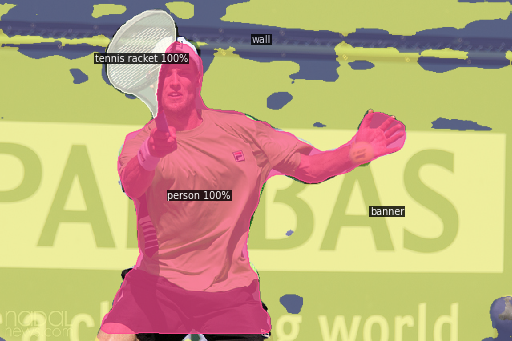

[{'id': 1, 'isthing': True, 'score': 0.9951297044754028, 'category_id': 15, 'instance_id': 0}, {'id': 2, 'isthing': False, 'category_id': 36, 'area': 14077}, {'id': 3, 'isthing': False, 'category_id': 52, 'area': 61921}]


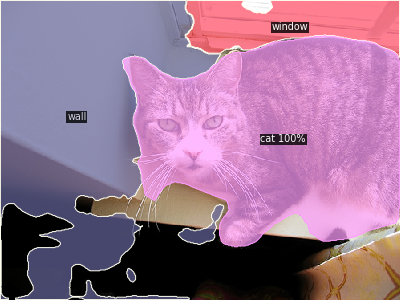

[{'id': 1, 'isthing': True, 'score': 0.9940190315246582, 'category_id': 62, 'instance_id': 0}, {'id': 2, 'isthing': True, 'score': 0.8923332691192627, 'category_id': 56, 'instance_id': 1}, {'id': 3, 'isthing': False, 'category_id': 8, 'area': 31398}, {'id': 4, 'isthing': False, 'category_id': 41, 'area': 25148}, {'id': 5, 'isthing': False, 'category_id': 43, 'area': 7127}, {'id': 6, 'isthing': False, 'category_id': 52, 'area': 148898}, {'id': 7, 'isthing': False, 'category_id': 53, 'area': 5761}]


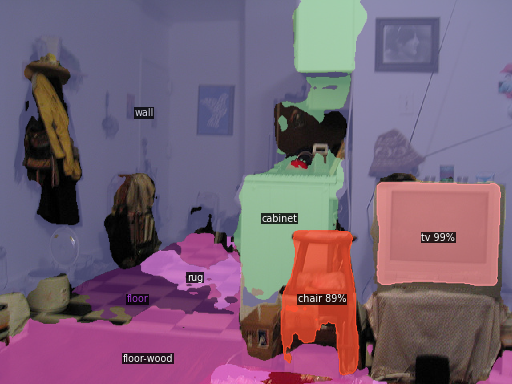

[{'id': 1, 'isthing': True, 'score': 0.9997673630714417, 'category_id': 0, 'instance_id': 0}, {'id': 2, 'isthing': True, 'score': 0.997965931892395, 'category_id': 37, 'instance_id': 1}, {'id': 3, 'isthing': True, 'score': 0.9619795680046082, 'category_id': 0, 'instance_id': 2}, {'id': 4, 'isthing': True, 'score': 0.9609252214431763, 'category_id': 37, 'instance_id': 3}, {'id': 5, 'isthing': False, 'category_id': 24, 'area': 256236}]


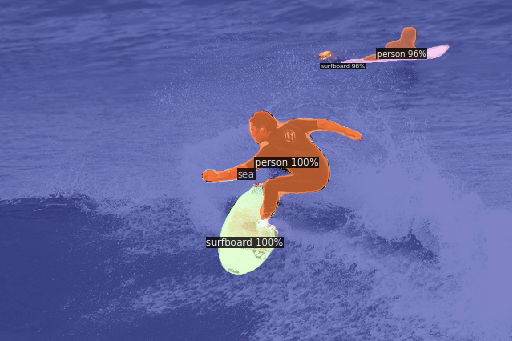

[{'id': 1, 'isthing': True, 'score': 0.9983521699905396, 'category_id': 14, 'instance_id': 0}, {'id': 2, 'isthing': True, 'score': 0.994340181350708, 'category_id': 14, 'instance_id': 1}, {'id': 3, 'isthing': False, 'category_id': 24, 'area': 232944}, {'id': 4, 'isthing': False, 'category_id': 52, 'area': 31316}]


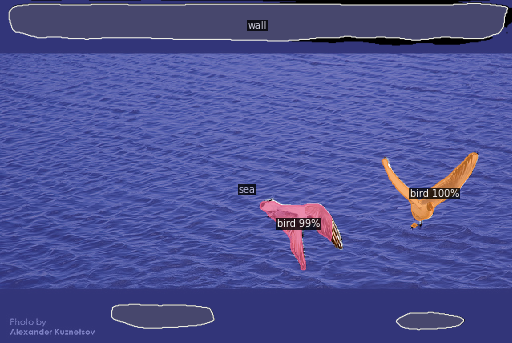

In [ ]:
# 예측 결과 시각화
from detectron2.utils.visualizer import ColorMode, Visualizer

for d in random.sample(val_dataset_dicts, 5):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs["panoptic_seg"][1])

    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.SEGMENTATION
    )
    v = v.draw_panoptic_seg_predictions(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1])
    cv2_imshow(v.get_image()[:, :, ::-1])

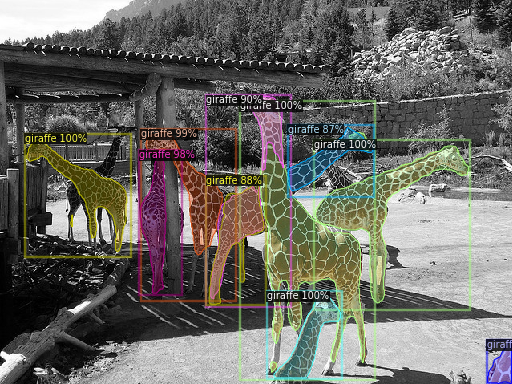

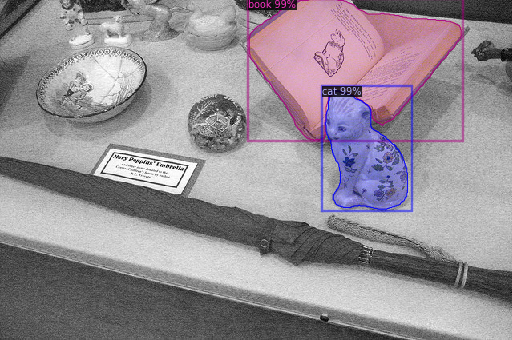

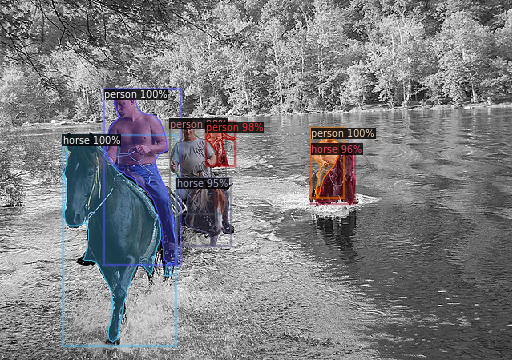

In [ ]:
# Instance 결과만 시각화
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
# predict 생성 시간 측정
import time
times = []
for i in range(20):
    start_time = time.time()
    outputs = predictor(im)
    delta = time.time() - start_time
    times.append(delta)
mean_delta = np.array(times).mean()
fps = 1 / mean_delta
print("Average(sec):{:.2f},fps:{:.2f}".format(mean_delta, fps))

Average(sec):0.19,fps:5.39


##### Custom Dataset 다운로드 & 압축 해제

In [ ]:
# 경로 이동
%cd /content/

/content


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!gdown https://drive.google.com/uc?id=1Za8ZiZmjlfTHqc_EauSkTXUStXstU5AY
!gdown https://drive.google.com/uc?id=13VuLbI0x3QxrsHBJb6akaQakMkYU9JeR
!gdown https://drive.google.com/uc?id=1e2ox8p4ttpbLcMP_VkgJCBw0I892etOp

Downloading...
From: https://drive.google.com/uc?id=1PZMfnha6A_MhUFBzHFEQsdsnISlITNGj
To: /content/panoptic_custom.zip
100% 23.4k/23.4k [00:00<00:00, 38.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1bsLcLZAlsO7ESMsaPndX7bsf4ssfrEG8
To: /content/panoptic_custom_label.zip
100% 17.3k/17.3k [00:00<00:00, 29.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1HLscleM3zgfOVQUvB4GTqEhACrYj6jTp
To: /content/segmentation_images.zip
100% 516k/516k [00:00<00:00, 141MB/s]


In [ ]:
!unzip /content/panoptic_custom.zip -d /content/detectron2_repo/datasets/coco
!rm /content/panoptic_custom.zip
!unzip /content/panoptic_custom_label.zip -d /content/detectron2_repo/datasets/coco
!rm /content/panoptic_custom_label.zip
!unzip /content/segmentation_images.zip -d /content/detectron2_repo/datasets/coco
!rm /content/segmentation_images.zip

Archive:  /content/panoptic_custom.zip
   creating: /content/detectron2_repo/datasets/coco/panoptic_custom/
  inflating: /content/detectron2_repo/datasets/coco/__MACOSX/._panoptic_custom  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_custom/000000000665.png  
  inflating: /content/detectron2_repo/datasets/coco/__MACOSX/panoptic_custom/._000000000665.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_custom/000000005685.png  
  inflating: /content/detectron2_repo/datasets/coco/__MACOSX/panoptic_custom/._000000005685.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_custom/000000000155.png  
  inflating: /content/detectron2_repo/datasets/coco/__MACOSX/panoptic_custom/._000000000155.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_custom/000000004053.png  
  inflating: /content/detectron2_repo/datasets/coco/__MACOSX/panoptic_custom/._000000004053.png  
  inflating: /content/detectron2_repo/datasets/coco/panoptic_custom/000

##### CVAT Label을 Panoptic FPN에서 사용되는 모델의 형식으로 변환

In [ ]:
# custom_instance.json을 만들기위해 COCO Api에 기존 valid label 파일을 넣어줌
from pycocotools.coco import COCO
coco=COCO('/content/detectron2_repo/datasets/coco/annotations/instances_val2017.json')

loading annotations into memory...
Done (t=0.70s)
creating index...
index created!


In [ ]:
# custom_instance.json 라벨 생성 (instance 객체)
import json
with open('/content/detectron2_repo/datasets/coco/annotations/panoptic_custom.json', 'r') as f:
    custom_json_data = json.load(f)
temp_categories = custom_json_data['categories']

with open('/content/detectron2_repo/datasets/coco/annotations/instances_val2017.json', 'r') as f:
    original_json_data = json.load(f)

custom_json_data['licenses'] = {
			"name": "",
			"id": 0,
			"url": ""
		}
#original_json_data['licenses']
custom_json_data['info'] = original_json_data['info']
custom_json_data['categories'] = original_json_data['categories']
change_categories_dict = {}

for temp in temp_categories:
  change_categories_dict[temp['id']] = coco.getCatIds(catNms=[temp['name']])
print(change_categories_dict)
new_ann_list = []
for ann in custom_json_data['annotations']:
  if change_categories_dict[ann["category_id"]] == []:
    continue
  ann["category_id"] = change_categories_dict[ann["category_id"]][0]
  new_ann_list.append(ann)
print(new_ann_list)
custom_json_data['annotations'] = new_ann_list
print(custom_json_data)

# instances json 파일 생성 & 변환 annotation 저장
with open('/content/detectron2_repo/datasets/coco/annotations/instances_custom.json', 'w', encoding='utf-8') as make_file:
    json.dump(custom_json_data, make_file, indent="\t")

{1: [21], 2: [88], 3: [17], 4: [32], 5: [5], 6: [16], 7: [], 8: [], 9: [], 10: [], 11: [], 12: [], 13: []}
[{'id': 2, 'image_id': 1, 'category_id': 21, 'segmentation': [[242.53, 189.09, 244.92, 185.2, 246.42, 180.72, 249.7, 177.44, 254.78, 175.65, 259.26, 173.86, 263.44, 171.77, 267.32, 169.08, 272.69, 168.48, 277.47, 168.18, 282.25, 167.59, 287.32, 166.69, 292.1, 166.09, 296.58, 165.79, 301.36, 165.79, 306.14, 164.9, 310.62, 164.3, 315.09, 162.21, 319.27, 160.12, 323.75, 158.63, 328.23, 157.43, 332.71, 155.64, 336.89, 153.55, 341.07, 151.16, 344.95, 148.77, 348.54, 145.79, 351.82, 142.21, 354.81, 138.62, 359.59, 137.73, 364.96, 138.32, 367.35, 142.5, 370.93, 145.49, 374.22, 148.77, 377.2, 152.36, 380.79, 155.34, 384.67, 157.73, 388.85, 159.82, 393.03, 161.91, 396.91, 164.3, 400.49, 167.59, 403.78, 171.17, 407.96, 173.26, 411.84, 175.65, 413.63, 179.83, 410.65, 183.41, 406.76, 185.8, 402.88, 188.19, 402.28, 192.67, 401.09, 197.15, 396.61, 196.55, 391.83, 195.36, 387.35, 195.06, 382.88,

In [ ]:
# 기존 panoptic valid label의 카테고리 이름과 아이디 정보를 읽어옴
with open('/content/detectron2_repo/datasets/coco/annotations/panoptic_val2017.json', 'r') as f:
    val_json_data = json.load(f)
print(val_json_data.keys())
print(val_json_data['categories'])
category_ref = {}
for cat in val_json_data['categories']:
  category_ref[cat['name']] = cat['id']
category_ref

dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])
[{'supercategory': 'person', 'isthing': 1, 'id': 1, 'name': 'person'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 2, 'name': 'bicycle'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 3, 'name': 'car'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 4, 'name': 'motorcycle'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 5, 'name': 'airplane'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 6, 'name': 'bus'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 7, 'name': 'train'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 8, 'name': 'truck'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 9, 'name': 'boat'}, {'supercategory': 'outdoor', 'isthing': 1, 'id': 10, 'name': 'traffic light'}, {'supercategory': 'outdoor', 'isthing': 1, 'id': 11, 'name': 'fire hydrant'}, {'supercategory': 'outdoor', 'isthing': 1, 'id': 13, 'name': 'stop sign'}, {'supercategory': 'outdoor', 'isthing': 1, 'id': 14, 'name': 

{'person': 1,
 'bicycle': 2,
 'car': 3,
 'motorcycle': 4,
 'airplane': 5,
 'bus': 6,
 'train': 7,
 'truck': 8,
 'boat': 9,
 'traffic light': 10,
 'fire hydrant': 11,
 'stop sign': 13,
 'parking meter': 14,
 'bench': 15,
 'bird': 16,
 'cat': 17,
 'dog': 18,
 'horse': 19,
 'sheep': 20,
 'cow': 21,
 'elephant': 22,
 'bear': 23,
 'zebra': 24,
 'giraffe': 25,
 'backpack': 27,
 'umbrella': 28,
 'handbag': 31,
 'tie': 32,
 'suitcase': 33,
 'frisbee': 34,
 'skis': 35,
 'snowboard': 36,
 'sports ball': 37,
 'kite': 38,
 'baseball bat': 39,
 'baseball glove': 40,
 'skateboard': 41,
 'surfboard': 42,
 'tennis racket': 43,
 'bottle': 44,
 'wine glass': 46,
 'cup': 47,
 'fork': 48,
 'knife': 49,
 'spoon': 50,
 'bowl': 51,
 'banana': 52,
 'apple': 53,
 'sandwich': 54,
 'orange': 55,
 'broccoli': 56,
 'carrot': 57,
 'hot dog': 58,
 'pizza': 59,
 'donut': 60,
 'cake': 61,
 'chair': 62,
 'couch': 63,
 'potted plant': 64,
 'bed': 65,
 'dining table': 67,
 'toilet': 70,
 'tv': 72,
 'laptop': 73,
 'mouse'

In [ ]:
# CVAT에서 사용한 컬러를 추가하여 추가된 Color - category 데이터를 color id와 category id의 매핑으로 변환
import cv2
from detectron2.data.datasets.builtin_meta import COCO_CATEGORIES
from panopticapi.utils import rgb2id

coco_cat = COCO_CATEGORIES.copy()
name2rgb = {'ceiling-merged':[250,250,55], 'floor-other-merged':[140,120,240], 'grass-merged':[102,255,102],
            'rug-merged':[50,183,250], 'sky-other-merged':[184,61,245], 'tree-merged':[36,179,83], 'wall-other-merged':[255,106,77],
            'cat':[52,209,183]}

with open('/content/detectron2_repo/datasets/coco/annotations/panoptic_custom.json', 'r') as f:
    custom_json_data = json.load(f)

id2rgb = {}
id2value = {}
for name in name2rgb.keys():
  id2rgb[category_ref[name]]=name2rgb[name]

for c in coco_cat:
  if c['id'] in id2rgb.keys():
    c['color'] = id2rgb[c['id']]
  id2value[c['id']]=rgb2id(c['color'])
print(coco_cat)
print(id2value)


[{'color': [220, 20, 60], 'isthing': 1, 'id': 1, 'name': 'person'}, {'color': [119, 11, 32], 'isthing': 1, 'id': 2, 'name': 'bicycle'}, {'color': [0, 0, 142], 'isthing': 1, 'id': 3, 'name': 'car'}, {'color': [0, 0, 230], 'isthing': 1, 'id': 4, 'name': 'motorcycle'}, {'color': [106, 0, 228], 'isthing': 1, 'id': 5, 'name': 'airplane'}, {'color': [0, 60, 100], 'isthing': 1, 'id': 6, 'name': 'bus'}, {'color': [0, 80, 100], 'isthing': 1, 'id': 7, 'name': 'train'}, {'color': [0, 0, 70], 'isthing': 1, 'id': 8, 'name': 'truck'}, {'color': [0, 0, 192], 'isthing': 1, 'id': 9, 'name': 'boat'}, {'color': [250, 170, 30], 'isthing': 1, 'id': 10, 'name': 'traffic light'}, {'color': [100, 170, 30], 'isthing': 1, 'id': 11, 'name': 'fire hydrant'}, {'color': [220, 220, 0], 'isthing': 1, 'id': 13, 'name': 'stop sign'}, {'color': [175, 116, 175], 'isthing': 1, 'id': 14, 'name': 'parking meter'}, {'color': [250, 0, 30], 'isthing': 1, 'id': 15, 'name': 'bench'}, {'color': [165, 42, 42], 'isthing': 1, 'id': 

In [ ]:
# Panoptic_custom.json 변환
import json
# Cvat custom json 로드
with open('/content/detectron2_repo/datasets/coco/annotations/panoptic_custom.json', 'r') as f:
    custom_json_data = json.load(f)

# 파일 이름 변환 쉽도록 dict화 시킴
img_dict = {}
for img in custom_json_data['images']:
  img_dict[img['id']]=img['file_name']

# 라벨 아이디 변환 쉽도록 커스텀 카테고리를 dict화 시킴
old_cat_dict = {}
for cat in custom_json_data['categories']:
  old_cat_dict[cat['id']] = cat['name']

# 새로운 annotation 구조
new_ann_json = []
for idx in img_dict.keys():
  segments_info = []
  file_name = img_dict[idx].split('.')[0]+'.png'
  image_id = idx
  new_ann_json.append({'segments_info':segments_info, 'file_name':file_name, 'image_id':image_id})

  for ann in custom_json_data['annotations']:
    if ann['image_id'] == idx:

      cat_name = old_cat_dict[ann['category_id']]

      if cat_name in ['wall', 'sky', 'floor']:
        cat_name = cat_name+'-other-merged'
      try:
        category_id =  category_ref[cat_name]
      except:
        cat_name = cat_name+'-merged'
        category_id =  category_ref[cat_name]
      s_id = id2value[category_id]
      area = int(ann['area'])
      bbox = [round(item) for item in ann['bbox']]
      iscrowd = 0 # ann['iscrowd']
      new_ann_json[idx-1]['segments_info'].append({'id':s_id,'category_id':category_id, 'area':area, 'bbox':bbox, 'iscrowd':iscrowd})

# info, categories coco json으로 대체
custom_json_data['info'] = val_json_data['info']
custom_json_data['categories'] = val_json_data['categories']

# 변형된 annotations 대체
custom_json_data['annotations'] = new_ann_json

print(custom_json_data)

with open('/content/detectron2_repo/datasets/coco/annotations/panoptic_custom.json', 'w', encoding='utf-8') as make_file:
    json.dump(custom_json_data, make_file, indent="\t")

{'licenses': [{'name': '', 'id': 0, 'url': ''}], 'info': {'description': 'COCO 2018 Panoptic Dataset', 'url': 'http://cocodataset.org', 'version': '1.0', 'year': 2018, 'contributor': 'https://arxiv.org/abs/1801.00868', 'date_created': '2018-06-01 00:00:00.0'}, 'categories': [{'supercategory': 'person', 'isthing': 1, 'id': 1, 'name': 'person'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 2, 'name': 'bicycle'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 3, 'name': 'car'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 4, 'name': 'motorcycle'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 5, 'name': 'airplane'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 6, 'name': 'bus'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 7, 'name': 'train'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 8, 'name': 'truck'}, {'supercategory': 'vehicle', 'isthing': 1, 'id': 9, 'name': 'boat'}, {'supercategory': 'outdoor', 'isthing': 1, 'id': 10, 'name': 'traffic light'}, {'supercat

In [ ]:
# stuff image 생성을 위한 기존 detectron method 커스텀
import functools
import json
import multiprocessing as mp
import numpy as np
import os
import time
from fvcore.common.download import download
from panopticapi.utils import rgb2id
from PIL import Image

def _process_panoptic_to_semantic(input_panoptic, output_semantic, segments, id_map):
    panoptic = np.asarray(Image.open(input_panoptic), dtype=np.uint32)
    panoptic = rgb2id(panoptic)
    output = np.zeros_like(panoptic, dtype=np.uint8) + 255
    for seg in segments:
        cat_id = seg["category_id"]
        new_cat_id = id_map[cat_id]
        output[panoptic == id2value[cat_id]] = new_cat_id
    Image.fromarray(output).save(output_semantic)


def separate_coco_semantic_from_panoptic(panoptic_json, panoptic_root, sem_seg_root, categories):
    """
    Create semantic segmentation annotations from panoptic segmentation
    annotations, to be used by PanopticFPN.

    It maps all thing categories to class 0, and maps all unlabeled pixels to class 255.
    It maps all stuff categories to contiguous ids starting from 1.

    Args:
        panoptic_json (str): path to the panoptic json file, in COCO's format.
        panoptic_root (str): a directory with panoptic annotation files, in COCO's format.
        sem_seg_root (str): a directory to output semantic annotation files
        categories (list[dict]): category metadata. Each dict needs to have:
            "id": corresponds to the "category_id" in the json annotations
            "isthing": 0 or 1
    """
    os.makedirs(sem_seg_root, exist_ok=True)

    stuff_ids = [k["id"] for k in categories if k["isthing"] == 0]
    thing_ids = [k["id"] for k in categories if k["isthing"] == 1]
    id_map = {}  # map from category id to id in the output semantic annotation
    assert len(stuff_ids) <= 254
    for i, stuff_id in enumerate(stuff_ids):
        id_map[stuff_id] = i + 1
    for thing_id in thing_ids:
        id_map[thing_id] = 0
    id_map[0] = 255
    with open(panoptic_json) as f:
        obj = json.load(f)
    pool = mp.Pool(processes=max(mp.cpu_count() // 2, 4))

    def iter_annotations():
        for anno in obj["annotations"]:
            file_name = anno["file_name"]
            segments = anno["segments_info"]
            input = os.path.join(panoptic_root, file_name)
            output = os.path.join(sem_seg_root, file_name)
            yield input, output, segments

    print("Start writing to {} ...".format(sem_seg_root))
    start = time.time()
    pool.starmap(
        functools.partial(_process_panoptic_to_semantic, id_map=id_map),
        iter_annotations(),
        chunksize=100,
    )
    print("Finished. time: {:.2f}s".format(time.time() - start))


In [ ]:
dataset_dir = os.path.join("/content/detectron2_repo/datasets", "coco")
for s in ["custom"]:
    separate_coco_semantic_from_panoptic(
        os.path.join(dataset_dir, "annotations/panoptic_{}.json".format(s)),
        os.path.join(dataset_dir, "panoptic_{}".format(s)),
        os.path.join(dataset_dir, "panoptic_stuff_{}".format(s)),
        coco_cat,
    )

Start writing to /content/detectron2_repo/datasets/coco/panoptic_stuff_custom ...
Finished. time: 0.05s


In [ ]:
# test 데이터셋 등록
test_image_root = "/content/detectron2_repo/datasets/coco/segmentation_images"
test_panoptic_root = "/content/detectron2_repo/datasets/coco/panoptic_custom"
test_panoptic_json = "/content/detectron2_repo/datasets/coco/annotations/panoptic_custom.json"
test_sem_seg_root = "/content/detectron2_repo/datasets/coco/panoptic_stuff_custom"
test_instances_json = "/content/detectron2_repo/datasets/coco/annotations/instances_custom.json"
register_coco_panoptic_separated("panoptic_test", {}, test_image_root, test_panoptic_root, test_panoptic_json, test_sem_seg_root, test_instances_json)

In [ ]:
test_metadata = MetadataCatalog.get("panoptic_test_separated")

In [ ]:
add_stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower', 'fruit', 'gravel', 'house', 'light', 'mirror-stuff', 'net', 'pillow', 'platform', 'playingfield', 'railroad', 'river', 'road', 'roof', 'sand', 'sea', 'shelf', 'snow', 'stairs', 'tent', 'towel', 'wall-brick', 'wall-stone', 'wall-tile', 'wall-wood', 'water', 'window-blind', 'window', 'tree', 'fence', 'ceiling', 'sky', 'cabinet', 'table', 'floor', 'pavement', 'mountain', 'grass', 'dirt', 'paper', 'food', 'building', 'rock', 'wall', 'rug']
add_stuff_dataset_id_to_contiguous_id={92: 1, 93: 2, 95: 3, 100: 4, 107: 5, 109: 6, 112: 7, 118: 8, 119: 9, 122: 10, 125: 11, 128: 12, 130: 13, 133: 14, 138: 15, 141: 16, 144: 17, 145: 18, 147: 19, 148: 20, 149: 21, 151: 22, 154: 23, 155: 24, 156: 25, 159: 26, 161: 27, 166: 28, 168: 29, 171: 30, 175: 31, 176: 32, 177: 33, 178: 34, 180: 35, 181: 36, 184: 37, 185: 38, 186: 39, 187: 40, 188: 41, 189: 42, 190: 43, 191: 44, 192: 45, 193: 46, 194: 47, 195: 48, 196: 49, 197: 50, 198: 51, 199: 52, 200: 53, 0: 0}
add_stuff_colors=[[82, 18, 128], [255, 255, 128], [147, 211, 203], [150, 100, 100], [168, 171, 172], [146, 112, 198], [210, 170, 100], [92, 136, 89], [218, 88, 184], [241, 129, 0], [217, 17, 255], [124, 74, 181], [70, 70, 70], [255, 228, 255], [154, 208, 0], [193, 0, 92], [76, 91, 113], [255, 180, 195], [106, 154, 176], [230, 150, 140], [60, 143, 255], [128, 64, 128], [92, 82, 55], [254, 212, 124], [73, 77, 174], [255, 160, 98], [255, 255, 255], [104, 84, 109], [169, 164, 131], [225, 199, 255], [137, 54, 74], [135, 158, 223], [7, 246, 231], [107, 255, 200], [58, 41, 149], [183, 121, 142], [255, 73, 97], [36, 179, 83], [190, 153, 153], [250, 250, 55], [184, 61, 245], [134, 199, 156], [209, 226, 140], [140, 120, 240], [96, 96, 96], [64, 170, 64], [102, 255, 102], [208, 229, 228], [206, 186, 171], [152, 161, 64], [116, 112, 0], [0, 114, 143], [255, 106, 77], [50, 183, 250]]
add_thing_classes=['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
add_thing_dataset_id_to_contiguous_id={1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 13: 11, 14: 12, 15: 13, 16: 14, 17: 15, 18: 16, 19: 17, 20: 18, 21: 19, 22: 20, 23: 21, 24: 22, 25: 23, 27: 24, 28: 25, 31: 26, 32: 27, 33: 28, 34: 29, 35: 30, 36: 31, 37: 32, 38: 33, 39: 34, 40: 35, 41: 36, 42: 37, 43: 38, 44: 39, 46: 40, 47: 41, 48: 42, 49: 43, 50: 44, 51: 45, 52: 46, 53: 47, 54: 48, 55: 49, 56: 50, 57: 51, 58: 52, 59: 53, 60: 54, 61: 55, 62: 56, 63: 57, 64: 58, 65: 59, 67: 60, 70: 61, 72: 62, 73: 63, 74: 64, 75: 65, 76: 66, 77: 67, 78: 68, 79: 69, 80: 70, 81: 71, 82: 72, 84: 73, 85: 74, 86: 75, 87: 76, 88: 77, 89: 78, 90: 79}
add_thing_colors=[[220, 20, 60], [119, 11, 32], [0, 0, 142], [0, 0, 230], [106, 0, 228], [0, 60, 100], [0, 80, 100], [0, 0, 70], [0, 0, 192], [250, 170, 30], [100, 170, 30], [220, 220, 0], [175, 116, 175], [250, 0, 30], [165, 42, 42], [52,209,183], [0, 226, 252], [182, 182, 255], [0, 82, 0], [120, 166, 157], [110, 76, 0], [174, 57, 255], [199, 100, 0], [72, 0, 118], [255, 179, 240], [0, 125, 92], [209, 0, 151], [188, 208, 182], [0, 220, 176], [255, 99, 164], [92, 0, 73], [133, 129, 255], [78, 180, 255], [0, 228, 0], [174, 255, 243], [45, 89, 255], [134, 134, 103], [145, 148, 174], [255, 208, 186], [197, 226, 255], [171, 134, 1], [109, 63, 54], [207, 138, 255], [151, 0, 95], [9, 80, 61], [84, 105, 51], [74, 65, 105], [166, 196, 102], [208, 195, 210], [255, 109, 65], [0, 143, 149], [179, 0, 194], [209, 99, 106], [5, 121, 0], [227, 255, 205], [147, 186, 208], [153, 69, 1], [3, 95, 161], [163, 255, 0], [119, 0, 170], [0, 182, 199], [0, 165, 120], [183, 130, 88], [95, 32, 0], [130, 114, 135], [110, 129, 133], [166, 74, 118], [219, 142, 185], [79, 210, 114], [178, 90, 62], [65, 70, 15], [127, 167, 115], [59, 105, 106], [142, 108, 45], [196, 172, 0], [95, 54, 80], [128, 76, 255], [201, 57, 1], [246, 0, 122], [191, 162, 208]]

In [ ]:
MetadataCatalog.get("panoptic_test_separated").set(stuff_classes=add_stuff_classes)
MetadataCatalog.get("panoptic_test_separated").set(stuff_dataset_id_to_contiguous_id=add_stuff_dataset_id_to_contiguous_id)
MetadataCatalog.get("panoptic_test_separated").set(stuff_colors=add_stuff_colors)
MetadataCatalog.get("panoptic_test_separated").set(thing_classes=add_thing_classes)
MetadataCatalog.get("panoptic_test_separated").set(thing_dataset_id_to_contiguous_id=add_thing_dataset_id_to_contiguous_id)
MetadataCatalog.get("panoptic_test_separated").set(thing_colors=add_thing_colors)

Metadata(name='panoptic_test_separated', panoptic_root='/content/detectron2_repo/datasets/coco/panoptic_custom', image_root='/content/detectron2_repo/datasets/coco/segmentation_images', panoptic_json='/content/detectron2_repo/datasets/coco/annotations/panoptic_custom.json', sem_seg_root='/content/detectron2_repo/datasets/coco/panoptic_stuff_custom', json_file='/content/detectron2_repo/datasets/coco/annotations/instances_custom.json', evaluator_type='coco_panoptic_seg', ignore_label=255, stuff_classes=['things', 'banner', 'blanket', 'bridge', 'cardboard', 'counter', 'curtain', 'door-stuff', 'floor-wood', 'flower', 'fruit', 'gravel', 'house', 'light', 'mirror-stuff', 'net', 'pillow', 'platform', 'playingfield', 'railroad', 'river', 'road', 'roof', 'sand', 'sea', 'shelf', 'snow', 'stairs', 'tent', 'towel', 'wall-brick', 'wall-stone', 'wall-tile', 'wall-wood', 'water', 'window-blind', 'window', 'tree', 'fence', 'ceiling', 'sky', 'cabinet', 'table', 'floor', 'pavement', 'mountain', 'grass',

In [ ]:
test_dataset_dicts = DatasetCatalog.get("panoptic_test_separated")
test_metadata = MetadataCatalog.get("panoptic_test_separated")

WARNING [03/21 04:01:53 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 04:01:53 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/detectron2_repo/datasets/coco/annotations/instances_custom.json
[03/21 04:01:53 d2.data.datasets.coco]: Loaded 5 images with semantic segmentation from /content/detectron2_repo/datasets/coco/segmentation_images


##### 커스텀 데이터 테스트

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("panoptic_test_separated", )

evaluator = COCOPanopticEvaluator("panoptic_test_separated",output_dir="./output")
test_loader = build_detection_test_loader(cfg, "panoptic_test_separated")
inference_on_dataset(trainer.model, test_loader, evaluator)

WARNING [03/21 04:02:29 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/21 04:02:29 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/detectron2_repo/datasets/coco/annotations/instances_custom.json
[03/21 04:02:29 d2.data.datasets.coco]: Loaded 5 images with semantic segmentation from /content/detectron2_repo/datasets/coco/segmentation_images
[03/21 04:02:29 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/21 04:02:29 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/21 04:02:29 d2.data.common]: Serializing 5 elements to byte tensors and concatenating them all ...
[03/21 04:02:29 d2.data.common]: Serialized dataset takes 0.02 MiB
[03/21 04:02:29 d2.evaluation.evaluator]: Start inference on 5 batches
[03/21 04:02:30 d2.evaluatio

OrderedDict([('panoptic_seg',
              {'PQ': 16.37347547192957,
               'SQ': 16.37347547192957,
               'RQ': 20.0,
               'PQ_th': 8.858121266493074,
               'SQ_th': 8.858121266493074,
               'RQ_th': 16.666666666666664,
               'PQ_st': 21.383711608887232,
               'SQ_st': 21.383711608887232,
               'RQ_st': 22.22222222222222})])

##### 커스텀 테스트 데이터 예측 생성 & 시각화

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85   # set the testing threshold for this model
cfg.DATASETS.TEST = ("panoptic_test_separated", )
predictor = DefaultPredictor(cfg)

[03/21 04:02:32 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/outputs/model_final.pth ...


[{'id': 1, 'isthing': True, 'score': 0.937114417552948, 'category_id': 15, 'instance_id': 0}, {'id': 2, 'isthing': False, 'category_id': 6, 'area': 8362}]


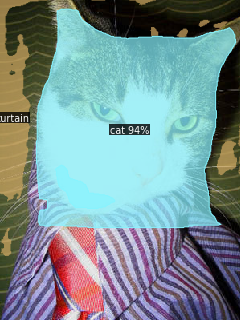

[{'id': 1, 'isthing': True, 'score': 0.9977072477340698, 'category_id': 14, 'instance_id': 0}, {'id': 2, 'isthing': False, 'category_id': 40, 'area': 189919}]


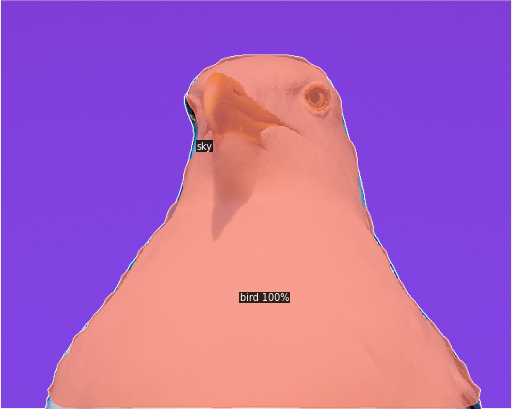

[{'id': 1, 'isthing': True, 'score': 0.9989774227142334, 'category_id': 19, 'instance_id': 0}, {'id': 2, 'isthing': True, 'score': 0.9982201457023621, 'category_id': 19, 'instance_id': 1}, {'id': 3, 'isthing': False, 'category_id': 40, 'area': 29964}, {'id': 4, 'isthing': False, 'category_id': 46, 'area': 170769}]


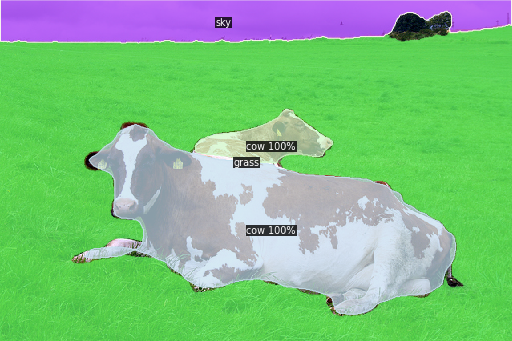

[{'id': 1, 'isthing': True, 'score': 0.9996341466903687, 'category_id': 4, 'instance_id': 0}, {'id': 2, 'isthing': False, 'category_id': 40, 'area': 100748}]


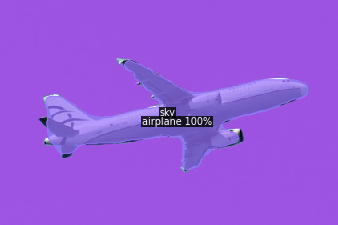

[{'id': 1, 'isthing': True, 'score': 0.9954285621643066, 'category_id': 77, 'instance_id': 0}, {'id': 2, 'isthing': False, 'category_id': 8, 'area': 9092}, {'id': 3, 'isthing': False, 'category_id': 42, 'area': 52316}, {'id': 4, 'isthing': False, 'category_id': 52, 'area': 24891}]


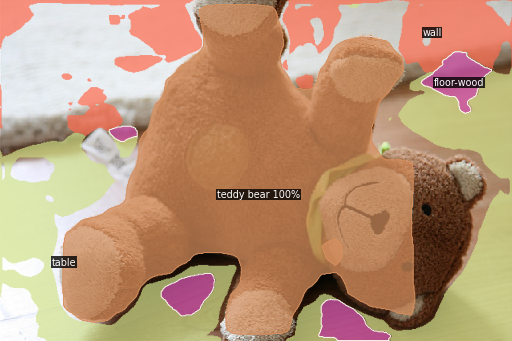

In [ ]:
# Panoptic 시각화
from detectron2.utils.visualizer import ColorMode, Visualizer

for d in random.sample(test_dataset_dicts, 5):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs["panoptic_seg"][1])

    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.SEGMENTATION
    )
    v = v.draw_panoptic_seg_predictions(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1])
    cv2_imshow(v.get_image()[:, :, ::-1])

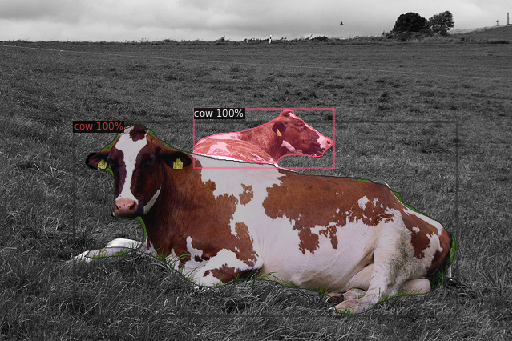

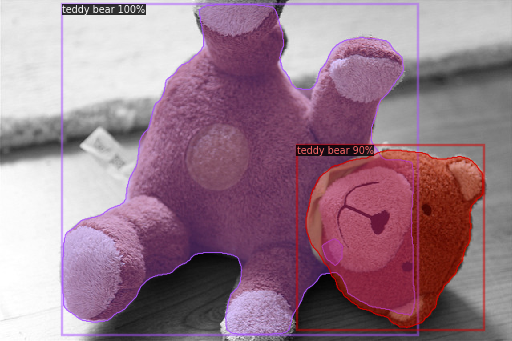

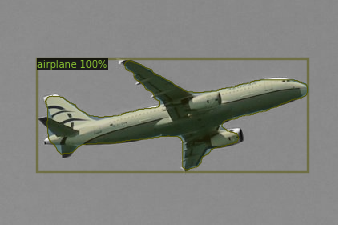

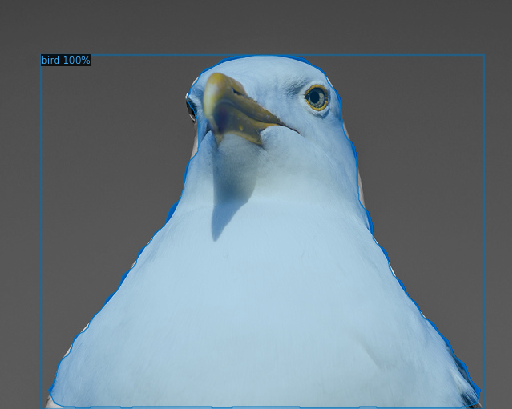

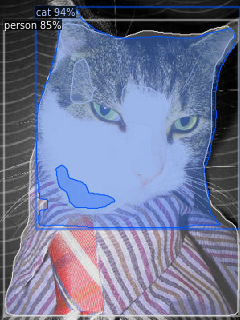

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(test_dataset_dicts, 5):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])